In [ ]:
#!unzip "drive/MyDrive/Sports/sports.zip" -d "drive/MyDrive/Sports/"

# End-to-end Multi-class Sports_Type Classification

This notebook builds an End-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the Type of Sports by the given image of a Sport.

## 2. Data

The data we're using is from Kaggle 100 sports image calssification identification competition

https://www.kaggle.com/datasets/gpiosenka/sports-classification/
## 3. Evaluation

Evaluation is a file with prediction probabilities for each  Sports Type of each test image

## 4. Features

Some information about the data:
* We're dealing with image (unstructed data) so it's probably best we use deep learning and Transfer learning
* There are 100 Types of Sports (This means there are 100 different classes).
* There are around 10,000+ images in the training set(These images have labels).
* There are around 500+ images in the test set (These images have no labels,because we'll have to predict them).

## Checking versions of TF & TF_hub and also GPU

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("tensor flow Version",tf.__version__)
print("Tensor Flow Hub Version",hub.__version__)
print("GPU ","Available!!!!!"if tf.config.list_physical_devices("GPU") else "NOT Available :(")


tensor flow Version 2.12.0
Tensor Flow Hub Version 0.13.0
GPU  Available!!!!!


#Getting Data Loaded and convert Into Tensars
With all machine learning models,our data has to be in numerical format. So that's what we'll be doing first,Turning our dimages into Tensors(numerical representation)

Let's start by accessing our data and checking out the labels

In [ ]:
#checking out out lables
import pandas as pd
train_csv=pd.read_csv("drive/MyDrive/Sports/train.csv")
valid_csv=pd.read_csv("drive/MyDrive/Sports/valid.csv")
test_csv=pd.read_csv("drive/MyDrive/Sports/test.csv")
print(train_csv.describe())
print(train_csv.head())

                       filepaths            labels data set
count                      13572             13572    13572
unique                     13572               100        1
top     train/air hockey/001.jpg  formula 1 racing    train
freq                           1               191    13572
                  filepaths      labels data set
0  train/air hockey/001.jpg  air hockey    train
1  train/air hockey/002.jpg  air hockey    train
2  train/air hockey/003.jpg  air hockey    train
3  train/air hockey/004.jpg  air hockey    train
4  train/air hockey/005.jpg  air hockey    train


In [ ]:
train_csv.tail()

,filepaths,labels,data set
13567,train/wingsuit flying/94.jpg,wingsuit flying,train
13568,train/wingsuit flying/95.jpg,wingsuit flying,train
13569,train/wingsuit flying/96.jpg,wingsuit flying,train
13570,train/wingsuit flying/97.jpg,wingsuit flying,train
13571,train/wingsuit flying/98.jpg,wingsuit flying,train


In [ ]:
train_csv["data set"].value_counts()

train    13572
Name: data set, dtype: int64

In [ ]:
#Count no of Sports
train_csv["labels"].value_counts()

formula 1 racing      191
football              191
nascar racing         190
baseball              174
hockey                172
                     ... 
horseshoe pitching    102
ultimate               99
arm wrestling          99
wingsuit flying        98
sky surfing            59
Name: labels, Length: 100, dtype: int64

<Axes: >

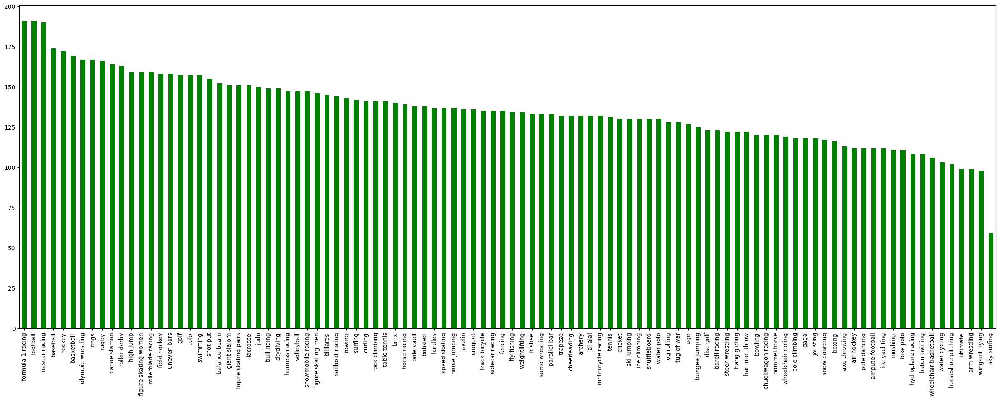

In [ ]:
#visualize it in Bar Plot
train_csv["labels"].value_counts().plot.bar(color="green",figsize=(30,10))

In [ ]:
#find mean of Images
train_csv["labels"].value_counts().median()

134.5

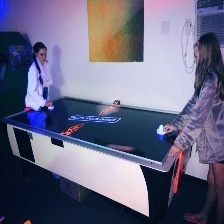

In [ ]:
#View an Images
from IPython.display import Image
Image("drive/MyDrive/Sports/train/air hockey/064.jpg")

##Getting Images and their Lables

In [ ]:
#creating Path Names
trainfiles=["drive/MyDrive/Sports/"+fname for fname in train_csv["filepaths"]]
valfiles=["drive/MyDrive/Sports/"+fname for fname in valid_csv["filepaths"]]
test_path=["drive/MyDrive/Sports/"+fname for fname in test_csv["filepaths"]]
trainfiles[:5],valfiles[:5],test_path[:3]

(['drive/MyDrive/Sports/train/air hockey/001.jpg',
  'drive/MyDrive/Sports/train/air hockey/002.jpg',
  'drive/MyDrive/Sports/train/air hockey/003.jpg',
  'drive/MyDrive/Sports/train/air hockey/004.jpg',
  'drive/MyDrive/Sports/train/air hockey/005.jpg'],
 ['drive/MyDrive/Sports/valid/air hockey/1.jpg',
  'drive/MyDrive/Sports/valid/air hockey/2.jpg',
  'drive/MyDrive/Sports/valid/air hockey/3.jpg',
  'drive/MyDrive/Sports/valid/air hockey/4.jpg',
  'drive/MyDrive/Sports/valid/air hockey/5.jpg'],
 ['drive/MyDrive/Sports/test/air hockey/1.jpg',
  'drive/MyDrive/Sports/test/air hockey/2.jpg',
  'drive/MyDrive/Sports/test/air hockey/3.jpg'])

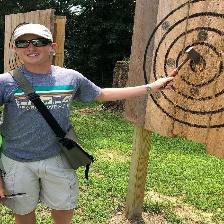

In [ ]:
Image (trainfiles[464])

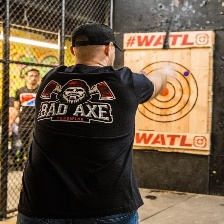

In [ ]:
Image (valfiles[23])

##Let's Prepare Lables

In [ ]:
import numpy as np
labels_train = train_csv["labels"].to_numpy()
labels_valid = valid_csv["labels"].to_numpy()
#labels=np.array(labels)
labels_train[:5],labels_valid[:5]

(array(['air hockey', 'air hockey', 'air hockey', 'air hockey',
        'air hockey'], dtype=object),
 array(['air hockey', 'air hockey', 'air hockey', 'air hockey',
        'air hockey'], dtype=object))

In [ ]:
#Find Unique Type of Sports
unique_train=np.unique(labels_train)
unique_valid=np.unique(labels_valid)
unique_train

array(['air hockey', 'ampute football', 'archery', 'arm wrestling',
       'axe throwing', 'balance beam', 'barell racing', 'baseball',
       'basketball', 'baton twirling', 'bike polo', 'billiards', 'bmx',
       'bobsled', 'bowling', 'boxing', 'bull riding', 'bungee jumping',
       'canoe slamon', 'cheerleading', 'chuckwagon racing', 'cricket',
       'croquet', 'curling', 'disc golf', 'fencing', 'field hockey',
       'figure skating men', 'figure skating pairs',
       'figure skating women', 'fly fishing', 'football',
       'formula 1 racing', 'frisbee', 'gaga', 'giant slalom', 'golf',
       'hammer throw', 'hang gliding', 'harness racing', 'high jump',
       'hockey', 'horse jumping', 'horse racing', 'horseshoe pitching',
       'hurdles', 'hydroplane racing', 'ice climbing', 'ice yachting',
       'jai alai', 'javelin', 'jousting', 'judo', 'lacrosse',
       'log rolling', 'luge', 'motorcycle racing', 'mushing',
       'nascar racing', 'olympic wrestling', 'parallel bar',
 

In [ ]:
len(unique_train),len(unique_valid)

(100, 100)

In [ ]:
#turn a label into an Array of Booleans
print(labels_train[0])
labels_train[0]==unique_train

air hockey


array([ True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [ ]:
print(labels_valid[0])
labels_valid[44]==unique_valid

air hockey


array([False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [ ]:
#turning every labels in to Boolean arrays
bool_train = [label == unique_train for label in labels_train]
bool_train[113:117]

[array([False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False]),
 array([False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, Fal

In [ ]:
bool_valid = [label == unique_train for label in labels_valid]
bool_valid[379]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [ ]:
len(bool_train),len(bool_valid)

(13572, 500)

In [ ]:
#converting boolean arrys into integers
print(labels_train[0])
print(bool_train[0].astype(int))

air hockey
[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels_valid[114])
print(bool_valid[114].astype(int))

croquet
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


##Validation Set
In this data set we have validation set,if it's not there you need to create

In [ ]:
x_train=trainfiles[:800]
y_train=bool_train[:800]
x_val=valfiles[:200]
y_val=bool_valid[:200]

In [ ]:
len(x_train),len(x_val)

(800, 200)

In [ ]:
#Let's have a geez at the traning data
x_train[:2],y_train[:2]

(['drive/MyDrive/Sports/train/air hockey/001.jpg',
  'drive/MyDrive/Sports/train/air hockey/002.jpg'],
 [array([ True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False]),
  array([ True, False, False, False, False, False, False, False, False,
         False,

In [ ]:
x_val[:2],y_val[:2]

(['drive/MyDrive/Sports/valid/air hockey/1.jpg',
  'drive/MyDrive/Sports/valid/air hockey/2.jpg'],
 [array([ True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False]),
  array([ True, False, False, False, False, False, False, False, False,
         False, Fal






















##Preprocessing Images(conver into tensors)

To preprocess our images into Tensors were going to write a function whch does a few tings

1.take an image filepath as input

2.Use TF to read file and save it to a variable,image

3.turn our image(JPG) into Tensors

4.Resizeimage to be a shape of(224,224)

5.Return Modified image


In [ ]:
from matplotlib.pyplot import imread
image=imread(x_train[27])
image.shape

(224, 224, 3)

In [ ]:
image

array([[[119,  98,  77],
        [117,  95,  74],
        [107,  80,  63],
        ...,
        [126, 109,  81],
        [116,  99,  71],
        [112,  97,  68]],

       [[125, 100,  80],
        [124,  97,  78],
        [119,  87,  72],
        ...,
        [116,  99,  71],
        [116,  99,  71],
        [123, 108,  79]],

       [[127,  98,  80],
        [126,  94,  79],
        [129,  95,  83],
        ...,
        [115,  98,  70],
        [120, 103,  75],
        [128, 113,  84]],

       ...,

       [[ 74,  38,  24],
        [ 74,  38,  24],
        [ 72,  39,  22],
        ...,
        [ 17,  14,   7],
        [ 17,  14,   7],
        [ 17,  14,   7]],

       [[ 75,  39,  25],
        [ 74,  38,  24],
        [ 72,  39,  22],
        ...,
        [ 17,  14,   7],
        [ 17,  14,   7],
        [ 17,  14,   7]],

       [[ 77,  39,  26],
        [ 75,  39,  25],
        [ 74,  38,  22],
        ...,
        [ 17,  14,   7],
        [ 17,  14,   7],
        [ 17,  14,   7]]

##Images to Tensors

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(224, 224, 3), dtype=uint8, numpy=
array([[[119,  98,  77],
        [117,  95,  74],
        [107,  80,  63],
        ...,
        [126, 109,  81],
        [116,  99,  71],
        [112,  97,  68]],

       [[125, 100,  80],
        [124,  97,  78],
        [119,  87,  72],
        ...,
        [116,  99,  71],
        [116,  99,  71],
        [123, 108,  79]],

       [[127,  98,  80],
        [126,  94,  79],
        [129,  95,  83],
        ...,
        [115,  98,  70],
        [120, 103,  75],
        [128, 113,  84]],

       ...,

       [[ 74,  38,  24],
        [ 74,  38,  24],
        [ 72,  39,  22],
        ...,
        [ 17,  14,   7],
        [ 17,  14,   7],
        [ 17,  14,   7]],

       [[ 75,  39,  25],
        [ 74,  38,  24],
        [ 72,  39,  22],
        ...,
        [ 17,  14,   7],
        [ 17,  14,   7],
        [ 17,  14,   7]],

       [[ 77,  39,  26],
        [ 75,  39,  25],
        [ 74,  38,  22],
        ...,
        [ 17,  14,   

Now we've seen what an image looke like as a Tensor,Let's make a function to preprocess them.

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable,`image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image`(Convert image size from 0-224 to 0-1)
5. Resize the `image` to be shape of (224,224)
6. Return the modified `image`

In [ ]:
#Creating function to preprocessing images
def process_images(img_path):
  """
  Takes an image filepath and turns an image into a sensor
  """
  # Read in a image file
  image=tf.io.read_file(img_path)
  # Turning Jpg into Tensors with colour channels(RGB)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour value b/w 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to (224,224)
  #in this data we already have images in size(224,224)
  image=tf.image.resize(image,size=[224,224])

  return image

##Turing data into Batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images i one go...they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be)

In order to use Tensorflow effectively, we need our data in the form of Tensorflow tuples which looks like this : `(images,labels)`

In [ ]:
#A Functiion to return a Tuple(image,label)
def get_img_label(img_path,label):
  image=process_images(img_path)
  return image,label

In [ ]:
(process_images(x_train[27]),tf.constant(y_train[27]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.45882356, 0.37254903, 0.28235295],
         [0.454902  , 0.35686275, 0.27058825],
         [0.4039216 , 0.29803923, 0.23137257],
         ...,
         [0.4901961 , 0.42352945, 0.3137255 ],
         [0.4431373 , 0.38431376, 0.27058825],
         [0.43137258, 0.37254903, 0.25882354]],
 
        [[0.4784314 , 0.3803922 , 0.29411766],
         [0.4666667 , 0.36862746, 0.2901961 ],
         [0.44705886, 0.33333334, 0.27058825],
         ...,
         [0.45098042, 0.38431376, 0.27450982],
         [0.4431373 , 0.38431376, 0.27058825],
         [0.47450984, 0.4156863 , 0.3019608 ]],
 
        [[0.4901961 , 0.38431376, 0.30980393],
         [0.4784314 , 0.3647059 , 0.29411766],
         [0.4901961 , 0.3647059 , 0.30588236],
         ...,
         [0.4431373 , 0.37647063, 0.26666668],
         [0.46274513, 0.4039216 , 0.2901961 ],
         [0.49411768, 0.43529415, 0.32156864]],
 
        ...,
 
        [[0.28235295, 0.15294118

##Function to turn all of our data into Batches

In [ ]:
# Define the batchsize , 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None , batch_size=BATCH_SIZE , test_data=False , valid_data=False) :
  """
   Creates batches of data out of image (x) and label (y) pairs.
   Shuffles the data if it's training data ,but doesn't shuffle if its validation data.
   Also accepts test data as input (no labels).
  """
  # If its test data we probably don't have batches
  if test_data :
    print("Creating testing data batches..... :)")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths no labels
    data_batch = data.map(process_images).batch(BATCH_SIZE)
    return data_batch
  elif valid_data :
    print("Creating vaidation data batches ...... :)")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch
  else :
    print("Creating training data batches ........ :)")
    # Turning filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_img_label)

    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(x_train , y_train)
val_data = create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches ........ :)
Creating vaidation data batches ...... :)


In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 100), dtype=tf.bool, name=None))>

## Visualizing data batches

Our data is now in batches , however,this might be hard to understand/comprehend ,let's visualise them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  # Set up the figure
  plt.figure(figsize = (15,15))
  # Loop through 25 images in a batch
  for i in range(25):
    # Create subplots (5 rows,5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add image label as title
    plt.title(unique_train[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

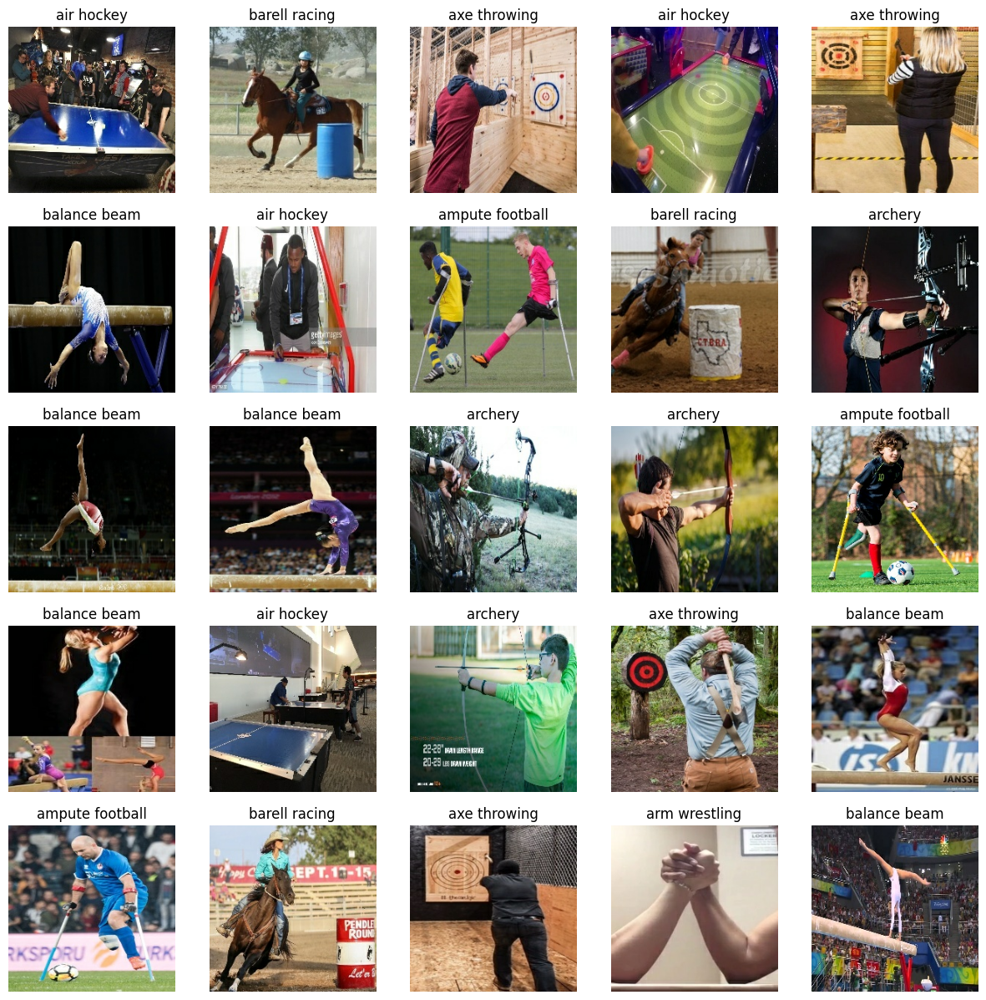

In [ ]:
# Now let's visualize the data in a training batch
train_images , train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images , train_labels)

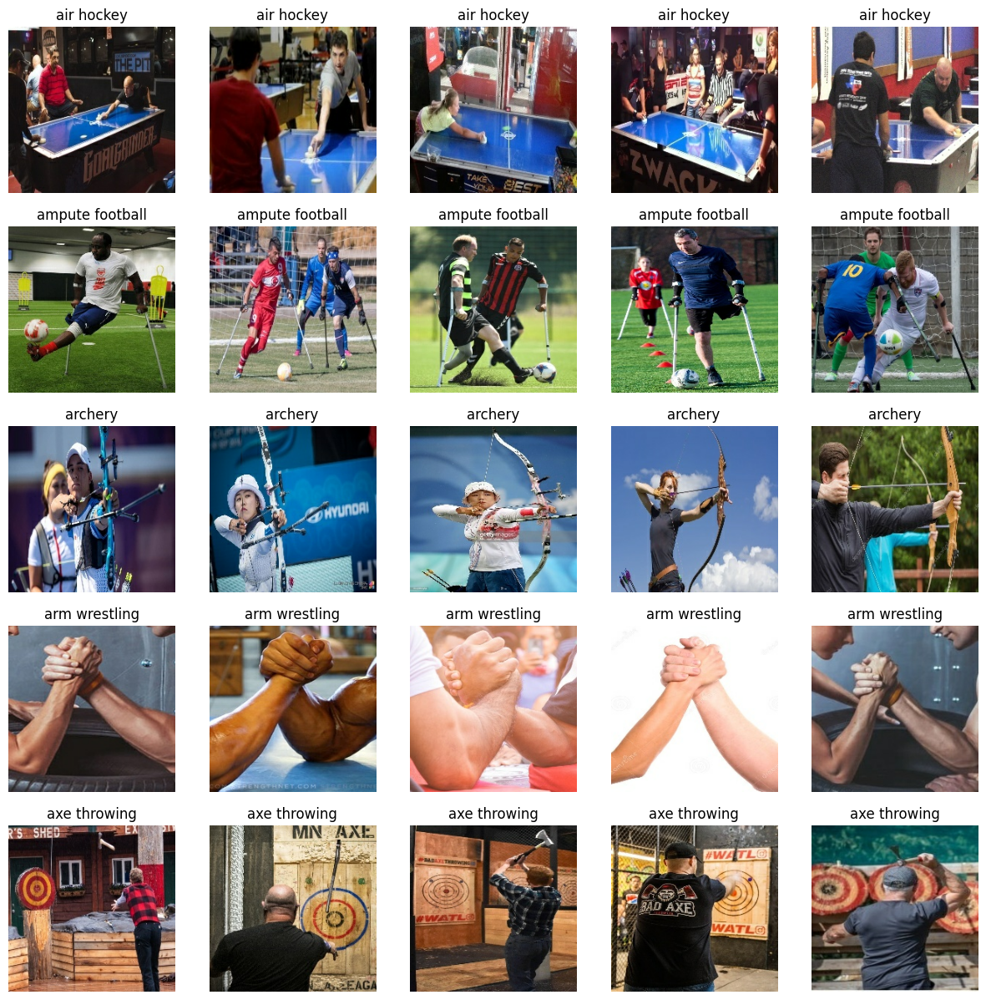

In [ ]:
# Now let's visualise validation data
val_images , val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

##Building a Model

Before building a model,the're a few things we need to define:
* The input shape(our images shapes,in the form of Tensors) to our model.
* The output shape(image labels,in the form of Tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None,224,224,3]

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_train)

#Setup model URL from Tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5"

Now we've got our inputs,outputs and model ready to go.Let's put them togther into  keras deep learning model!
Knowing this,let's create a function which :
* Takes the put shape,output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in a sequential fashion (do this first, then this,then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function ehich builds keras model
def create_model(input_shape = INPUT_SHAPE , output_shape = OUTPUT_SHAPE , model_url = MODEL_URL):
  print("Creating model using",MODEL_URL)

  #Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL) ,# Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Creating model using https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              6158505   
                                                                 
 dense (Dense)               (None, 100)               100200    
                                                                 
Total params: 6,258,705
Trainable params: 100,200
Non-trainable params: 6,158,505
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during trainning to do such things as save its progress or check its progress or stop training early if a model is improving.

We'll create two callbacks,one for tensorboard which helps track our models progress and another for early stopping which prevents our model from training for too long.

###TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model training logs with the `%tensorBoard` magic function (We'll do this after model training).

In [ ]:
#Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
import os

#Create a function to build  a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir =os.path.join ("/content/drive/MyDrive/Sports/logs",
                         #Make it so the logs get tracked whenever we run an experiment
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

###Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops imporving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
#Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

##Training a Model


In [ ]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100}

#Let's create a function to train our Model
1> Create a model usiing create_model()

2> setup a TensorBoard callback using create_tensorboard_callback()

3> call fit() function on our model passing it train & valid data & no.of epochs to train

4> return the trained model

In [ ]:
#A function to train & return a trained model
def train_model():
  #create a model
  model=create_model()
  #create new TensorBoard session
  tensorboard=create_tensorboard_callback()
  #fit the model to data
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model


In [ ]:
#model=train_model()

##checking Tensorboard logs

In [ ]:
#Creating tensorboard Logs
%tensorboard --logdir drive/MyDrive/Sports/logs

<IPython.core.display.Javascript object>

##Making & Evaluating Predictions using trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 100), dtype=tf.bool, name=None))>

In [ ]:
#making predictions on validation data
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 41s 5s/step


array([[0.03952252, 0.00164103, 0.00721728, ..., 0.00362429, 0.03425051,
        0.01707825],
       [0.00025191, 0.00208012, 0.00089035, ..., 0.00362915, 0.0387953 ,
        0.00404863],
       [0.00314583, 0.0009813 , 0.00359006, ..., 0.02540436, 0.00810487,
        0.00371512],
       ...,
       [0.00270253, 0.03654028, 0.01268478, ..., 0.00550542, 0.00109276,
        0.0033854 ],
       [0.00124962, 0.00078559, 0.00307327, ..., 0.0004084 , 0.00154901,
        0.00063286],
       [0.00596232, 0.01573425, 0.01023412, ..., 0.00088852, 0.00206751,
        0.00945904]], dtype=float32)

In [ ]:
predictions.shape

(200, 100)

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
#first prediction
index=0
print(predictions[index])
print(f"Max value:{np.max(predictions[index])}")
print(f"sum:{np.sum(predictions[index])}")
print(f"max index: {np.argmax(predictions[index])}")
print(f"Predictions label: {unique_train[np.argmax(predictions[index])]}")

[0.03952252 0.00164103 0.00721728 0.00962903 0.00446401 0.00508484
 0.00077909 0.00229748 0.00594926 0.00474873 0.01992269 0.01350127
 0.00105986 0.00112897 0.00200441 0.00728475 0.00163209 0.0026398
 0.01643553 0.00745638 0.01328718 0.00204526 0.0032392  0.01222385
 0.00055502 0.00156683 0.00215688 0.00930583 0.00700903 0.00486751
 0.00253164 0.00210404 0.00612547 0.01014721 0.00175461 0.01152834
 0.03990272 0.00224978 0.00075436 0.00056029 0.00287986 0.00310711
 0.01733868 0.0005952  0.01610418 0.00762095 0.0021077  0.00648998
 0.02413872 0.01741323 0.01443827 0.00291116 0.00283121 0.00099467
 0.10146596 0.01045885 0.00220457 0.00010898 0.00418044 0.02849757
 0.01199115 0.0092063  0.00142053 0.05796411 0.00433971 0.00627916
 0.01965938 0.01026233 0.03402147 0.00170793 0.00327384 0.01064673
 0.00098735 0.00252867 0.01971455 0.0077034  0.00699705 0.00529908
 0.00259075 0.00051802 0.0033899  0.00434718 0.00220273 0.00268414
 0.06026838 0.02374414 0.00127503 0.00058024 0.00107026 0.00888

In [ ]:
#Turning Prediction probabilities in to their respective labels

def get_pred_label(pred_prob):
  """
  Turns an array of prediction probabilities in to labels
  """
  return unique_train[np.argmax(pred_prob)]

pred_label=get_pred_label(predictions[0])
pred_label

'log rolling'

[link text](https://)##Unbatch the Batches

In [ ]:
#Function to Unbatch The Dataset
def unbatcher(data):
  images=[]
  labels=[]
  #Loop through unbatched data
  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_train[np.argmax(label)])
  return images,labels

#Unabching the Validation data
val_images,val_labels=unbatcher(val_data)
val_images[0],val_labels[0]




(array([[[1.        , 1.        , 0.9843138 ],
         [1.        , 1.        , 0.9843138 ],
         [1.        , 1.        , 0.9843138 ],
         ...,
         [0.10196079, 0.09803922, 0.08235294],
         [0.08235294, 0.08627451, 0.06666667],
         [0.09803922, 0.10196079, 0.08235294]],
 
        [[1.        , 1.        , 0.9921569 ],
         [1.        , 1.        , 0.9843138 ],
         [1.        , 1.        , 0.9843138 ],
         ...,
         [0.0627451 , 0.05882353, 0.04313726],
         [0.07450981, 0.07843138, 0.05882353],
         [0.07058824, 0.07450981, 0.05490196]],
 
        [[1.        , 1.        , 1.        ],
         [1.        , 1.        , 0.9921569 ],
         [1.        , 1.        , 0.9921569 ],
         ...,
         [0.10588236, 0.10196079, 0.08235294],
         [0.08235294, 0.07843138, 0.0627451 ],
         [0.10196079, 0.09803922, 0.08235294]],
 
        ...,
 
        [[0.6156863 , 0.28235295, 0.20392159],
         [0.63529414, 0.29411766, 0.22745

In [ ]:
def plot_pred(pred_prob,labels,images,n=1):
  pred_probab,true_label,images= pred_prob[n],labels[n],images[n]
  #get the pred Labels
  pred_label=get_pred_label(pred_probab)

  #plot images & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colou rof title depending on the prediction
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_probab)*100,
                                    true_label),
                                    color=color)


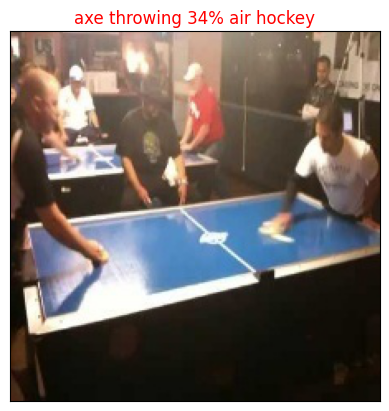

In [ ]:
plot_pred(pred_prob=predictions,
          labels=val_labels,
          images=val_images)

In [ ]:
def plot_pred_conf(pred_prob,labels,n=0):
    pred_probab,true_label=pred_prob[n],labels[n]
    #Get predicted Label
    pred_label=get_pred_label(pred_probab)
    #Find top 10 prediction confidence indexes
    top_pred_index=pred_probab.argsort()[-10:][::-1]
    #Find top 10 prediction confidence values
    top_pred_values=pred_probab[top_pred_index]
    #Find top 10 prediction confidence labels
    top_pred_labels=unique_train[top_pred_index]

    #plot setup
    top_plot=plt.bar(np.arange(len(top_pred_labels)),
                     top_pred_values,
                     color="grey")
    plt.xticks(np.arange(len(top_pred_labels)),
               labels=top_pred_labels,
               rotation="vertical")
    #change colour for true Labels
    if np.isin(true_label,top_pred_labels):
        top_plot[np.argmax(top_pred_labels==true_label)].set_color("green")
    else:
        pass



In [ ]:
predictions[1].argsort()[-10:]

array([46, 61, 29, 36, 86, 98, 85, 33, 54,  4])

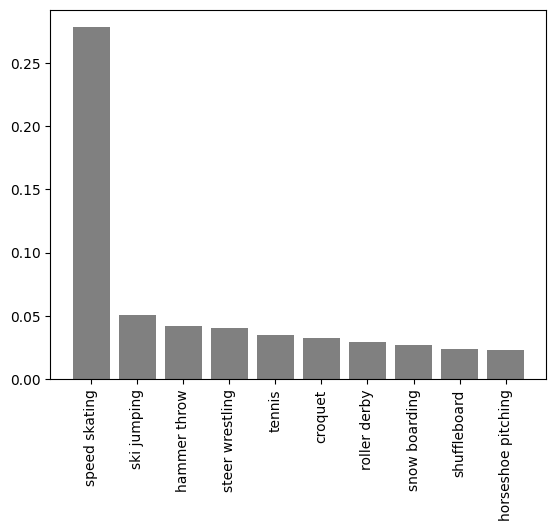

In [ ]:
plot_pred_conf(pred_prob=predictions,
               labels=val_labels,
               n=7)

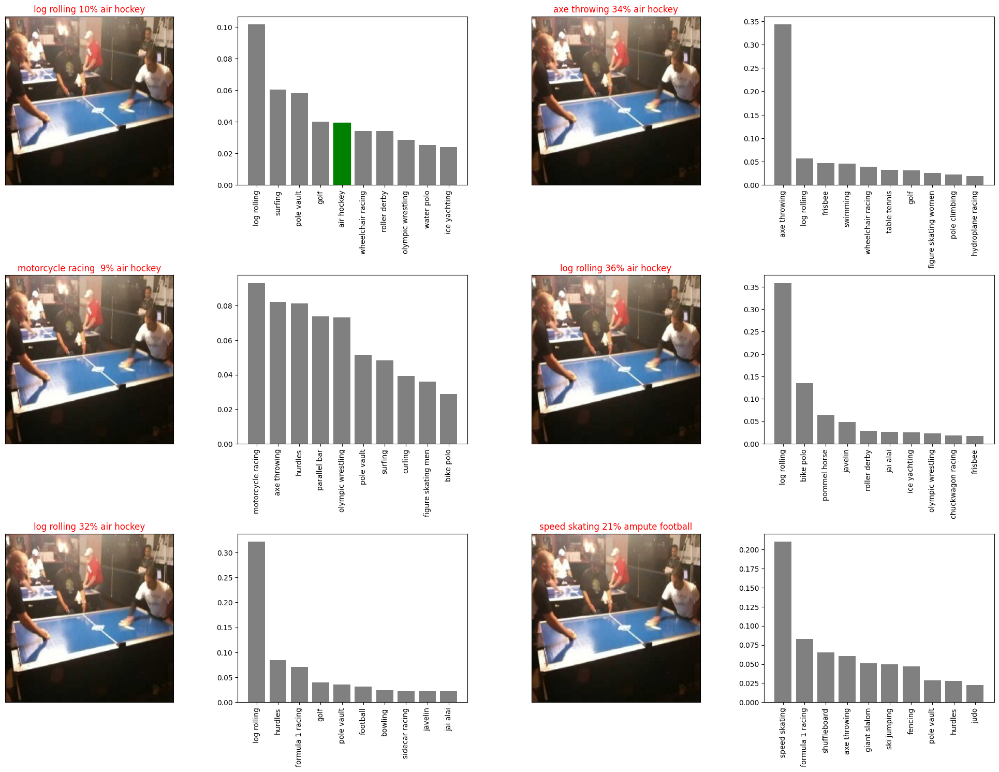

In [ ]:
#Let's check out few more predictions & values
i_mult=0
n_rows=3
n_cols=2
n_img=n_rows*n_cols
plt.figure(figsize=(10*n_cols,5*n_rows))

for i in range(n_img):
    plt.subplot(n_rows,2*n_cols,2*i+1)
    plot_pred(pred_prob=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_mult)
    plt.subplot(n_rows,2*n_cols,2*i+2)
    plot_pred_conf(pred_prob=predictions,
                   labels=val_labels,
                   n=i+i_mult)
plt.tight_layout(h_pad=1.0)
plt.show()

##Saving & Load Trained model

In [ ]:
#Create a function to save a model
def save_model(model,suffix=None):
    #Create model Directory
    modeldir=os.path.join("drive/MyDrive/Sports/Models",datetime.datetime.now().strftime("%Y%m%d=%H%M%s"))
    model_path=modeldir+"-"+suffix+".h5"#Saving Format of Model
    print(f"Saving Model to :{model_path}.....")
    model.save(model_path)
    return model_path

In [ ]:
#Create a Function to load a trained Model
def load_model(model_path):
    print(f"Lodinng Saved model from :{model_path}")
    model=tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
    return model

In [ ]:
#Save our trained Model
save_model(model,suffix="1000-image-mobilenet_v2_140-Adam")

Saving Model to :drive/MyDrive/Sports/Models/20230714=08181689322732-1000-image-mobilenet_v2_140-Adam.h5.....


'drive/MyDrive/Sports/Models/20230714=08181689322732-1000-image-mobilenet_v2_140-Adam.h5'

In [ ]:
loaded_model=load_model("drive/MyDrive/Sports/Models/20230420=19521682020332-1000-image-mobilenet_v2_140-Adam.h5")

Lodinng Saved model from :drive/MyDrive/Sports/Models/20230420=19521682020332-1000-image-mobilenet_v2_140-Adam.h5


**Evauating the Trained Model**

> Indented block



In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 61ms/step - loss: 5.5906 - accuracy: 0.0050


[5.590615749359131, 0.004999999888241291]

In [ ]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 1s 63ms/step - loss: 8.0699 - accuracy: 0.1750


[8.069914817810059, 0.17499999701976776]

##Training model with Full Dataset

In [ ]:
len(trainfiles),len(bool_train)

(13572, 13572)

In [ ]:
#Creating Batches for All data
full_data=create_data_batches(trainfiles,bool_train)

Creating training data batches ........ :)


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 100), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

Creating model using https://tfhub.dev/google/imagenet/mobilenet_v2_140_224/classification/5


In [ ]:
full_model_tensorboard=create_tensorboard_callback()

full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
#Fitting the model to Full Data
#full_model.fit(x=full_data,
 #              epochs=NUM_EPOCHS,
  #             callbacks=[full_model_tensorboard,full_model_early_stopping])

In [ ]:
save_model(full_model,suffix="full-image-set-trained-mobilenet_v2-Adam")

Saving Model to :drive/MyDrive/Sports/Models/20230714=08191689322742-full-image-set-trained-mobilenet_v2-Adam.h5.....


'drive/MyDrive/Sports/Models/20230714=08191689322742-full-image-set-trained-mobilenet_v2-Adam.h5'

In [ ]:
vali_data=create_data_batches(valfiles,bool_valid,valid_data=True)

Creating vaidation data batches ...... :)


###Evaluating th Model which is Trained with Full DataSet

In [ ]:
full_model.evaluate(vali_data)

16/16 [==============================] - 73s 5s/step - loss: 5.6744 - accuracy: 0.0120


[5.674384117126465, 0.012000000104308128]

In [ ]:
f_loaded_model=load_model("drive/MyDrive/Sports/Models/20230420=20561682024195-full-image-set-trained-mobilenet_v2-Adam.h5")

Lodinng Saved model from :drive/MyDrive/Sports/Models/20230420=20561682024195-full-image-set-trained-mobilenet_v2-Adam.h5


In [ ]:
f_loaded_model.evaluate(vali_data)

16/16 [==============================] - 2s 62ms/step - loss: 0.2476 - accuracy: 0.9220


[0.24757036566734314, 0.921999990940094]

##Make  Predictions on our Test Dataset



In [ ]:
test_path[:5]

['drive/MyDrive/Sports/test/air hockey/1.jpg',
 'drive/MyDrive/Sports/test/air hockey/2.jpg',
 'drive/MyDrive/Sports/test/air hockey/3.jpg',
 'drive/MyDrive/Sports/test/air hockey/4.jpg',
 'drive/MyDrive/Sports/test/air hockey/5.jpg']

In [ ]:
test_data=create_data_batches(test_path,test_data=True)

Creating testing data batches..... :)


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_pred=f_loaded_model.predict(test_data,
                                 verbose=1)

16/16 [==============================] - 111s 7s/step


In [ ]:
np.savetxt("drive/MyDrive/Sports/pred_labbels.csv",test_pred,delimiter=",")
test_predictions=np.loadtxt("drive/MyDrive/Sports/pred_labbels.csv",delimiter=",")
test_predictions[:15]

array([[9.99913692e-01, 3.75671521e-15, 1.53654067e-13, ...,
        1.93243459e-11, 1.03735445e-12, 1.54513186e-12],
       [9.33272004e-01, 3.48846754e-12, 5.96605876e-10, ...,
        7.70645784e-06, 7.01860570e-09, 5.80015425e-10],
       [9.99939799e-01, 1.67001760e-10, 1.26517435e-10, ...,
        4.98859509e-10, 2.53326193e-10, 4.88947424e-11],
       ...,
       [6.00143437e-08, 4.97307924e-11, 9.65976655e-01, ...,
        5.87080592e-11, 2.02283468e-10, 6.12710238e-08],
       [2.57052583e-16, 3.09085304e-14, 1.00000000e+00, ...,
        1.39962310e-18, 5.62836236e-13, 1.49223759e-14],
       [3.52118917e-10, 2.45181566e-12, 9.99999523e-01, ...,
        2.87442828e-16, 4.20009600e-12, 2.20800331e-12]])

In [ ]:
pred_df=pd.DataFrame(columns=["id"]+list(unique_train))
pred_df.head()

,id,air hockey,ampute football,archery,arm wrestling,axe throwing,balance beam,barell racing,baseball,basketball,...,tug of war,ultimate,uneven bars,volleyball,water cycling,water polo,weightlifting,wheelchair basketball,wheelchair racing,wingsuit flying


In [ ]:
test_path

['drive/MyDrive/Sports/test/air hockey/1.jpg',
 'drive/MyDrive/Sports/test/air hockey/2.jpg',
 'drive/MyDrive/Sports/test/air hockey/3.jpg',
 'drive/MyDrive/Sports/test/air hockey/4.jpg',
 'drive/MyDrive/Sports/test/air hockey/5.jpg',
 'drive/MyDrive/Sports/test/ampute football/1.jpg',
 'drive/MyDrive/Sports/test/ampute football/2.jpg',
 'drive/MyDrive/Sports/test/ampute football/3.jpg',
 'drive/MyDrive/Sports/test/ampute football/4.jpg',
 'drive/MyDrive/Sports/test/ampute football/5.jpg',
 'drive/MyDrive/Sports/test/archery/1.jpg',
 'drive/MyDrive/Sports/test/archery/2.jpg',
 'drive/MyDrive/Sports/test/archery/3.jpg',
 'drive/MyDrive/Sports/test/archery/4.jpg',
 'drive/MyDrive/Sports/test/archery/5.jpg',
 'drive/MyDrive/Sports/test/arm wrestling/1.jpg',
 'drive/MyDrive/Sports/test/arm wrestling/2.jpg',
 'drive/MyDrive/Sports/test/arm wrestling/3.jpg',
 'drive/MyDrive/Sports/test/arm wrestling/4.jpg',
 'drive/MyDrive/Sports/test/arm wrestling/5.jpg',
 'drive/MyDrive/Sports/test/axe thr

In [ ]:
#test_id=[os.path.splitext(path) for path in os.listdir(test_path_str)]
pred_df["id"]=test_path
pred_df.head()

,id,air hockey,ampute football,archery,arm wrestling,axe throwing,balance beam,barell racing,baseball,basketball,...,tug of war,ultimate,uneven bars,volleyball,water cycling,water polo,weightlifting,wheelchair basketball,wheelchair racing,wingsuit flying
0,drive/MyDrive/Sports/test/air hockey/1.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,drive/MyDrive/Sports/test/air hockey/2.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,drive/MyDrive/Sports/test/air hockey/3.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,drive/MyDrive/Sports/test/air hockey/4.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,drive/MyDrive/Sports/test/air hockey/5.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pred_df[list(unique_train)]=test_pred
pred_df.head()

,id,air hockey,ampute football,archery,arm wrestling,axe throwing,balance beam,barell racing,baseball,basketball,...,tug of war,ultimate,uneven bars,volleyball,water cycling,water polo,weightlifting,wheelchair basketball,wheelchair racing,wingsuit flying
0,drive/MyDrive/Sports/test/air hockey/1.jpg,0.999914,3.756715e-15,1.536541e-13,3.539995e-11,8.163312e-13,1.570386e-12,7.799651e-14,3.006770e-14,3.006515e-12,...,2.443918e-14,1.019292e-13,3.659002e-13,9.375991e-13,6.420269e-12,3.074368e-12,3.014865e-08,1.932435e-11,1.037354e-12,1.545132e-12
1,drive/MyDrive/Sports/test/air hockey/2.jpg,0.933272,3.488468e-12,5.966059e-10,8.463778e-07,3.065406e-09,3.824154e-09,2.130967e-10,3.084025e-06,4.316749e-07,...,1.517016e-07,1.753040e-10,1.447218e-07,8.445560e-06,8.102140e-10,2.231329e-07,5.233603e-07,7.706458e-06,7.018606e-09,5.800154e-10
2,drive/MyDrive/Sports/test/air hockey/3.jpg,0.999940,1.670018e-10,1.265174e-10,1.123368e-08,5.189858e-08,1.071985e-06,8.347715e-10,1.639268e-06,3.190353e-09,...,3.022372e-11,2.273083e-08,1.682676e-10,5.237642e-11,1.176545e-07,1.408325e-06,9.748042e-07,4.988595e-10,2.533262e-10,4.889474e-11
3,drive/MyDrive/Sports/test/air hockey/4.jpg,0.999999,9.426789e-13,7.021735e-11,2.181803e-10,1.247915e-09,1.211364e-11,5.725289e-12,1.521759e-10,2.270851e-09,...,1.926079e-11,6.123482e-12,2.101883e-11,3.127712e-12,4.268103e-11,4.512093e-11,1.066570e-09,9.980983e-11,2.880817e-12,1.021241e-11
4,drive/MyDrive/Sports/test/air hockey/5.jpg,0.999682,7.700401e-13,5.957603e-11,8.179376e-06,3.905722e-10,8.962681e-08,6.173568e-10,8.352551e-10,1.022829e-10,...,1.019289e-09,1.690082e-11,1.264164e-04,3.276878e-05,2.275534e-07,5.705549e-09,5.132921e-09,6.103560e-08,1.403397e-08,4.079770e-11


In [ ]:
pred_df.to_csv("drive/MyDrive/Sports/full_model_predictions.csv",
               index=False)

##Making predictions on our Custom Data

In [ ]:
cus_path="drive/MyDrive/Sports/images/"
cus_img_path=[cus_path+ fname for fname in os.listdir(cus_path)]
cus_img_path

['drive/MyDrive/Sports/images/5.jpg',
 'drive/MyDrive/Sports/images/2.jpg',
 'drive/MyDrive/Sports/images/4.jpg',
 'drive/MyDrive/Sports/images/3.jpg',
 'drive/MyDrive/Sports/images/1.jpg',
 'drive/MyDrive/Sports/images/6.jpg']

In [ ]:
cus_data=create_data_batches(cus_img_path,test_data=True)
cus_data

Creating testing data batches..... :)


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
cus_pred=f_loaded_model.predict(cus_data)
cus_pred.shape

1/1 [==============================] - 2s 2s/step


(6, 100)

In [ ]:
cus_pred_labels=[get_pred_label(cus_pred[i]) for i in range(len(cus_pred))]
cus_pred_labels

['basketball',
 'basketball',
 'basketball',
 'bull riding',
 'basketball',
 'baseball']

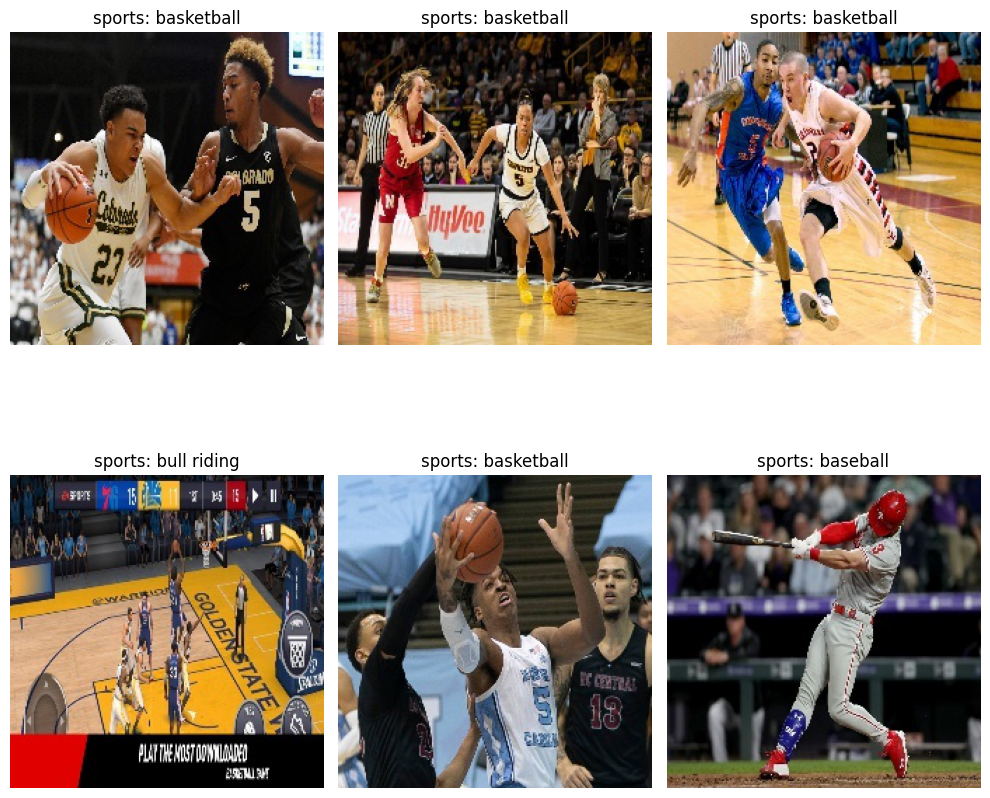

In [ ]:
# Calculate the number of rows and columns dynamically
num_images = len(cus_img_path)
num_cols = 3  # Number of columns to display
num_rows = (num_images + num_cols - 1) // num_cols  # Calculate number of rows

# Display the predicted labels along with their respective images
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

for i in range(num_images):
    img = plt.imread(cus_img_path[i])
    row = i // num_cols
    col = i % num_cols
    axes[row, col].imshow(img)
    axes[row, col].set_title(f"sports: {cus_pred_labels[i]}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()
